# World Bank Group Finances

## Case: What Affects the Amount Disbursed by the World Bank for Project Loans?

### [About World Bank Group Fiances](https://financesapp.worldbank.org/en/about/)

> WBG Finances is a World Bank Group digital platform that provides our clients and partners access to public financial data and portfolio information from across all Group entities in one place.

> WBG Finances ***simplifies*** the presentation of financial information in an _'easy to consume'_ and in the context of Country and Portfolio across WBG.

> All the data presented is available to everybody to analyze, visualize, and share with others. We invite you to explore the numerous tools, build your own visualizations or download the data in multiple forms. If you are a developer, connect to it through the APIs associated with all the datasets.

> So get started and:
>1. Explore the [Financial Summaries](https://financesapp.worldbank.org/en/summaries/ibrd-ida/) or [Country Summaries](https://financesapp.worldbank.org/en/countries/) for your country
>2. Download our [iPhone/iPad](https://itunes.apple.com/app/world-bank-finances/id465555488?mt=8) app or [Android](https://play.google.com/store/apps/details?id=com.worldbank.finances) app
>3. [Read the Terms of Use](https://financesapp.worldbank.org/en/terms/) associated with the use of data

> Please note that the datasets are raw and may not have been audited yet.

> For official data on the World Bank Group's finances please refer to:
>- [World Bank's Annual Report](http://www.worldbank.org/en/about/annual-report)
>- [IFC Annual Report](http://www.ifc.org/wps/wcm/connect/CORP_EXT_Content/IFC_External_Corporate_Site/Annual+Report/)
>- [MIGA's Annual Report](https://www.miga.org/Pages/Resources/Reports.aspx)

> Please also visit other data on the [World Bank open data website](http://data.worldbank.org/).

> The World Bank Group recognizes that transparency and accountability are essential to the develoment process and central to achieving the World Bank Group's mission to alleviate poverty. The World Bank Group's commitment to openness is also driven by a desire to foster public ownership, partnership and participation in development from a wide range of stakeholders. As a knowledge institution, the World Bank Group's first step is to share its knowledge freely and openly.

> In fulfilling its responsibilities, the World Bank Group complies with all sanctions applicable to World Bank Group transactions.

In [1]:
from warnings import filterwarnings
filterwarnings('ignore')

# The usual suspects ...
import pandas as pd
import numpy as np
import missingno as msn
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost
import shap

# And their accomplices
from sodapy import Socrata
from collections import defaultdict
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Plotting settings
sns.set(context='notebook', style='whitegrid', palette='deep', rc=None)
shap.initjs()

***

### Getting the Data

In [2]:
# 1. Authentication
client = Socrata(domain='finances.worldbank.org', 
                 app_token='myapptoken', 
                 username='myusername@somewhere.intheworld',
                 password='myfakepassword')

# 2. Conneting and extracting
results = client.get('8iaw-pcc6', limit=50000)

# 3. Convert to pandas dataframe
df = pd.DataFrame.from_records(results)

# Data types
df.dtypes

agreement_signing_date         object
board_approval_date            object
borrower                       object
borrower_s_obligation          object
cancelled_amount               object
closed_date_most_recent_       object
country                        object
country_code                   object
disbursed_amount               object
due_3rd_party                  object
due_to_ibrd                    object
effective_date_most_recent_    object
end_of_period                  object
exchange_adjustment            object
first_repayment_date           object
guarantor                      object
guarantor_country_code         object
interest_rate                  object
last_disbursement_date         object
last_repayment_date            object
loan_number                    object
loan_status                    object
loan_type                      object
loans_held                     object
original_principal_amount      object
project_id                     object
project_name

All the data is of the same type, that is, an `object`. We have to change this to the appropriate data type.

***

### Cleaning

#### Data Types

In [3]:
# Value converter
def value_converter(data, string, value_type):
    try:
        for i in zip(data.columns.str.contains(string), data.columns):
            if (i[0] == True and value_type == 'time'):
                data[i[1]] = pd.to_datetime(data[i[1]], format='%Y-%m-%d')
            if (i[0] == True and value_type == 'floating'):
                data[i[1]] = data[i[1]].astype(np.float)
            if (i[0] == True and value_type == 'integer'):
                data[i[1]] = data[i[1]].astype(np.int)
    except ValueError as a:
        print(a)

# Changing to datetime format
value_converter(data=df, string='date', value_type='time')
value_converter(data=df, string='period', value_type='time')

# Changing to floating point values
value_converter(data=df, string='amount', value_type='floating')
value_converter(data=df, string='due', value_type='floating')
value_converter(data=df, string='rate', value_type='floating')
value_converter(data=df, string='repaid', value_type='floating')
value_converter(data=df, string='sold', value_type='floating')
value_converter(data=df, string='loans_held', value_type='floating')
value_converter(data=df, string='exchange_adjustment', value_type='floating')
value_converter(data=df, string='borrower_s_obligation', value_type='floating')

# Checking the data types after convertion
df.dtypes

agreement_signing_date         datetime64[ns]
board_approval_date            datetime64[ns]
borrower                               object
borrower_s_obligation                 float64
cancelled_amount                      float64
closed_date_most_recent_       datetime64[ns]
country                                object
country_code                           object
disbursed_amount                      float64
due_3rd_party                         float64
due_to_ibrd                           float64
effective_date_most_recent_    datetime64[ns]
end_of_period                  datetime64[ns]
exchange_adjustment                   float64
first_repayment_date           datetime64[ns]
guarantor                              object
guarantor_country_code                 object
interest_rate                         float64
last_disbursement_date         datetime64[ns]
last_repayment_date            datetime64[ns]
loan_number                            object
loan_status                       

#### Missing Values

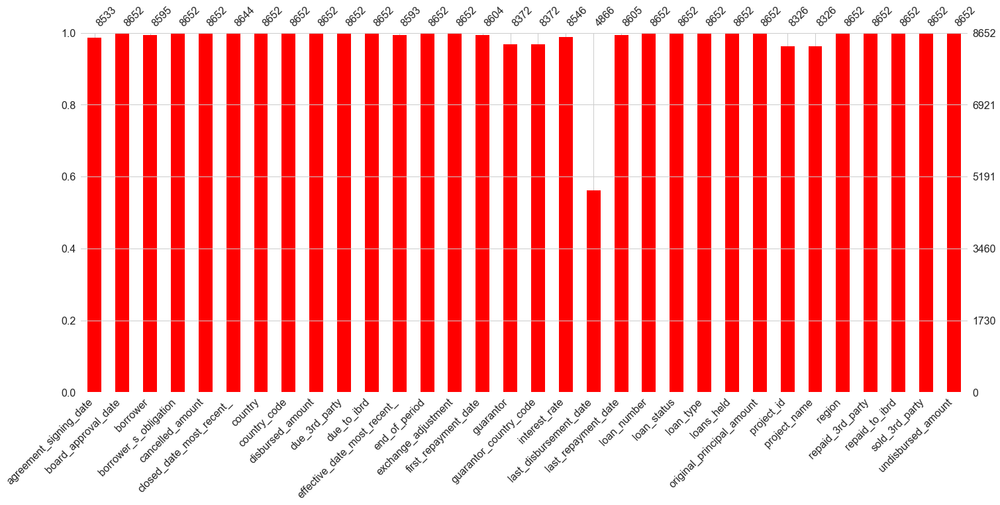

In [4]:
# Missing values
msn.bar(df, color='red')

`last_disbursement_date` has over 60% of its data missing. We will drop this column, then fill in the missing values in `project name`, `project id`, `guarantor` and `guarantor_country_code`.

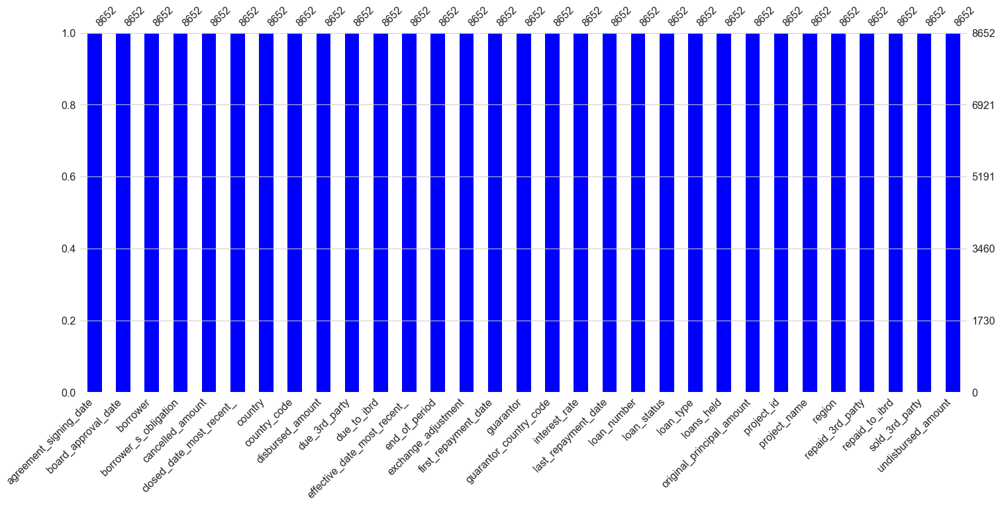

In [5]:
# Reshaping the dataframe
df = df.drop('last_disbursement_date', axis=1)

# Filling in missing values
df = df.fillna(method='backfill')

# Checking for missing values
msn.bar(df, color='blue')

***

### Preparing the Data for Analysis

In this analysis, we want to build a machine learning model for predicting the disbursed amount. The model will be built using [`xGBoost`](https://github.com/dmlc/xgboost). We will need to encode numerical values to non-numerical values before we proceed.

In [6]:
# Isolating data
cols = list()
for i in df.columns:
    if (df[i].dtypes == 'float64'):
        cols.append(i)
    elif (df[i].dtypes == 'object'):
        cols.append(i)

# Redefining the dataframe
df = df[cols]

# Encoding
cols_obj = list()
for i in df.columns:
    if (df[i].dtypes == 'object'):
        cols_obj.append(i)
d = defaultdict(LabelEncoder)
df[cols_obj] = df[cols_obj].apply(lambda x: d[x.name].fit_transform(x))

# Specifying the target
X, y = df.drop(['disbursed_amount', 'original_principal_amount'], axis=1), df.disbursed_amount

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=5)
d_train = xgboost.DMatrix(X_train, label=y_train)
d_test = xgboost.DMatrix(X_test, label=y_test)

### Training the model

In [7]:
# Parameters
params = {'eta' : .01,
          'objective' : 'reg:linear',
          'subsample' : .5, 
          'base_score' : np.mean(y_train),
          'eval_metric' : 'logloss'
         }

# Model
model = xgboost.train(params, d_train, 5000, 
                      evals=[(d_test, 'test')],
                      verbose_eval=50)

[0]	test-logloss:-2.3423e+09
[50]	test-logloss:-2.3423e+09
[100]	test-logloss:-2.3423e+09
[150]	test-logloss:-2.3423e+09
[200]	test-logloss:-2.3423e+09
[250]	test-logloss:-2.3423e+09
[300]	test-logloss:-2.3423e+09
[350]	test-logloss:-2.3423e+09
[400]	test-logloss:-2.3423e+09
[450]	test-logloss:-2.3423e+09
[500]	test-logloss:-2.3423e+09
[550]	test-logloss:-2.3423e+09
[600]	test-logloss:-2.3423e+09
[650]	test-logloss:-2.3423e+09
[700]	test-logloss:-2.3423e+09
[750]	test-logloss:-2.3423e+09
[800]	test-logloss:-2.3423e+09
[850]	test-logloss:-2.3423e+09
[900]	test-logloss:-2.3423e+09
[950]	test-logloss:-2.3423e+09
[1000]	test-logloss:-2.3423e+09
[1050]	test-logloss:-2.3423e+09
[1100]	test-logloss:-2.3423e+09
[1150]	test-logloss:-2.3423e+09
[1200]	test-logloss:-2.3423e+09
[1250]	test-logloss:-2.3423e+09
[1300]	test-logloss:-2.3423e+09
[1350]	test-logloss:-2.3423e+09
[1400]	test-logloss:-2.3423e+09
[1450]	test-logloss:-2.3423e+09
[1500]	test-logloss:-2.3423e+09
[1550]	test-logloss:-2.3423e+09

### Explaining Predictions

In [8]:
# Getting the SHAP values (takes a while to compute)
shap_values = shap.TreeExplainer(model).shap_values(X)

#### Single Prediction

In [9]:
shap.force_plot(shap_values[0,:], X.iloc[0,:])

The explanation above shows that there are 3 main feaatures that are pushing the base value to the model output:

> 1. the amount repaid to IBRD;
> 2. the amount due to IBRD; and
> 3. the borrower's obligation.

_**NB:**_ All these variables are pushing the base value down to the predicted model value of $\$4,847,345.87$ for the amount disbursed.

#### Multiple Prediction

If we take many explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for our entire dataset (this plot is interactive in the notebook):

In [10]:
shap.force_plot(shap_values[:100,:], X.iloc[:100,:])

In [11]:
shap.force_plot(shap_values, X)

#### Bar Charts of Feature Importance

<function matplotlib.pyplot.gca>

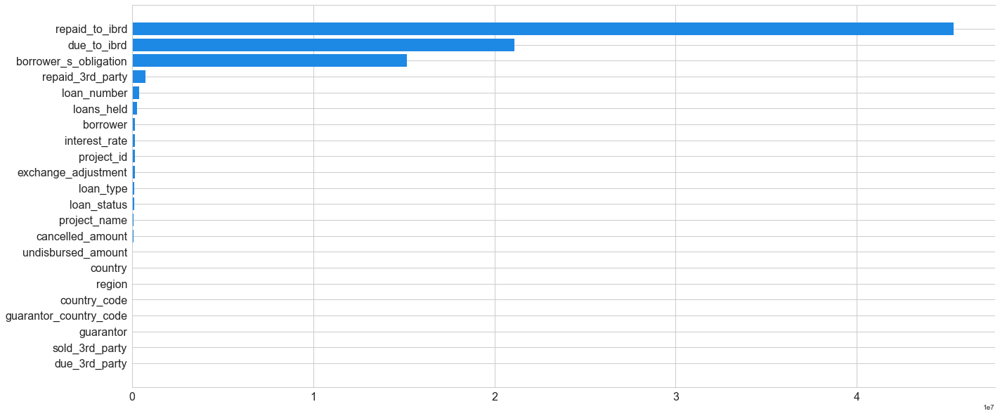

In [12]:
global_shap_values = np.abs(shap_values).mean(0)[:-1]
inds = np.argsort(global_shap_values)
y_pos = np.arange(X.shape[1])
plt.figure(figsize=(22, 10))
plt.barh(y_pos, global_shap_values[inds], color='#1E88E5')
plt.yticks(y_pos, X.columns[inds], fontsize=16)
plt.xticks(fontsize=16)
plt.gca().spines['right'].set_visible(False)
plt.gca

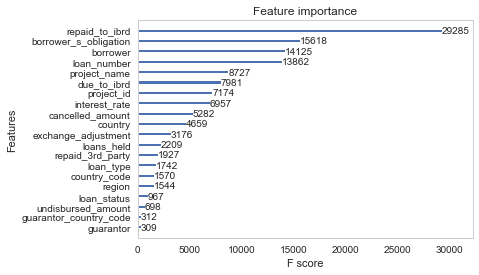

In [13]:
# Weight - number of times a feature appears in a tree
xgboost.plot_importance(model, grid=False)

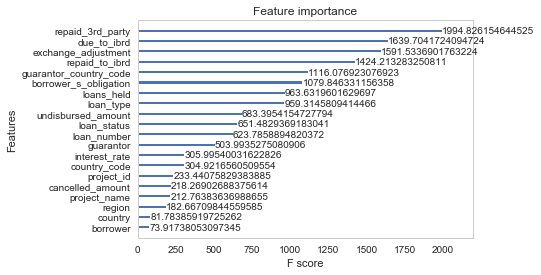

In [14]:
# Cover - average coverage of splits which use the feature, where coverage is the number of samples affected by the split
xgboost.plot_importance(model, importance_type='cover', grid=False)

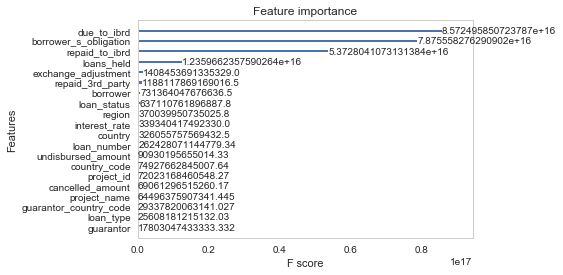

In [15]:
# Gain - average gain of splits which use the feature
xgboost.plot_importance(model, importance_type='gain', grid=False)

### Summary Plot

The feature importance bar charts give inconsistent results for the model. We will now use a density scatter chart of SHAP values for each feature. This will assist us to identify how much impact each feature has on the model's output.

> Features are sorted by the sum of the SHAP value magnitudes across all samples.

_**NB:**_ It is interesting that the amounts repaid, and due are more important in predicting the amount disbursed. All other features (excluding the borrower's obligation) have a high densities at impact close to zero, that is, they don't matter that much in determining the amount disbursed by the World Bank. 

From the chart, values in red represent high values, while blue represents low values. In conclusion, our model shows that for the three main features,

> 1. the amount paid to IBRD;
> 2. the amount due to IBRD; and
> 3. the borrower's obligation,

high values (red dots) have a high impact in lowering the disbursed amount.

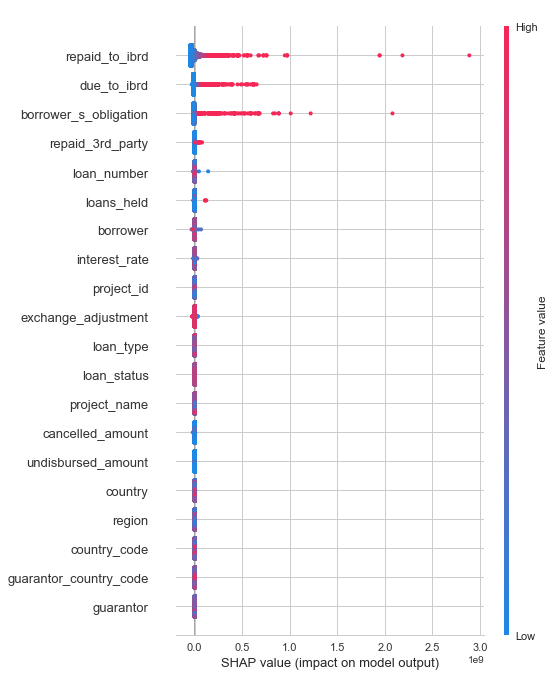

In [16]:
shap.summary_plot(shap_values, X)

#### Dependency Plot

Here we can further explore the effect of each variable on the model's output.

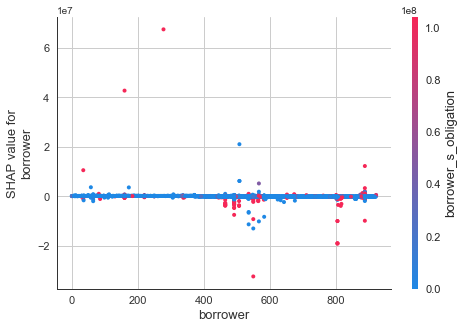

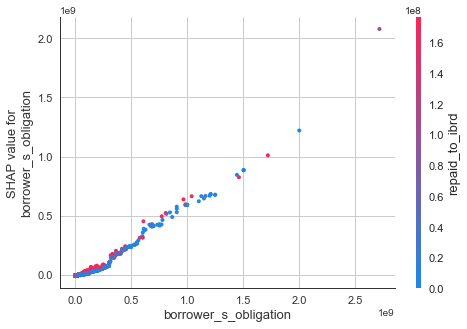

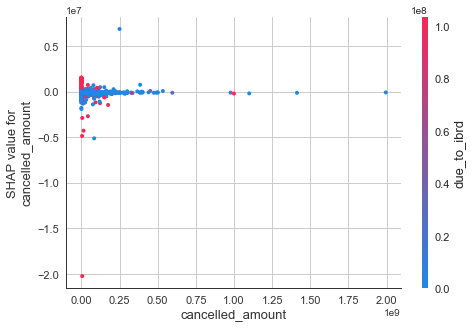

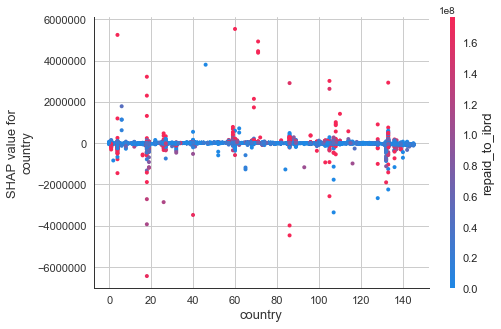

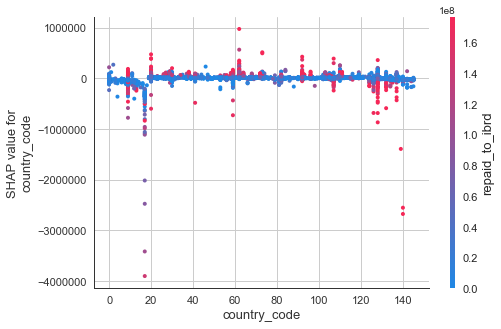

...

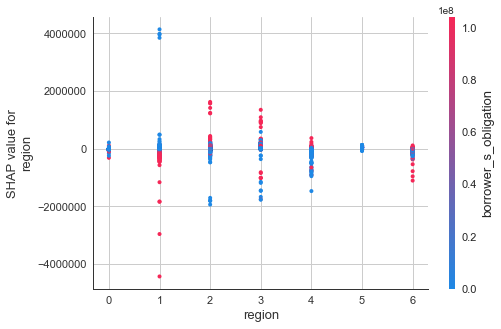

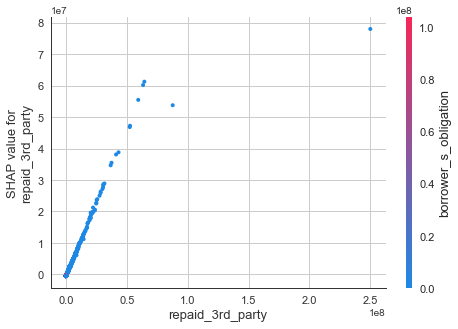

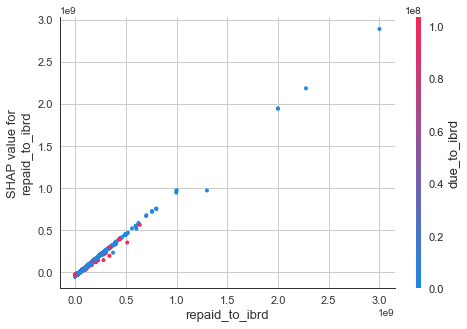

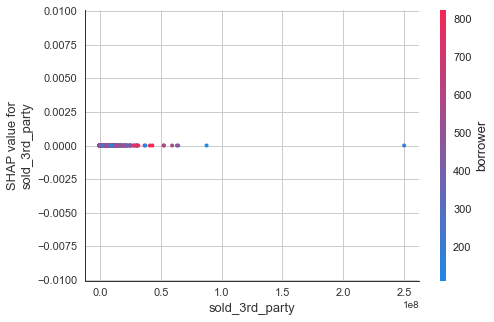

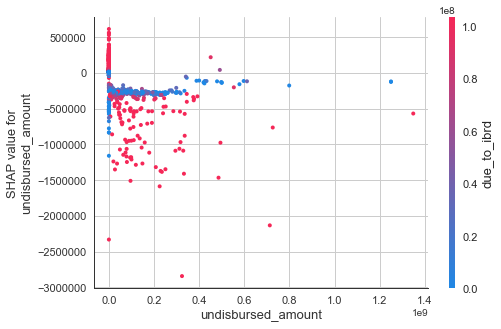

In [17]:
try:
    for name in X_train.columns:
        shap.dependence_plot(name, shap_values, X, display_features=X)
except:
    pass